In [8]:
!pip install tqdm


In [2]:
!pip install --upgrade requests urllib3


In [ ]:
!pip install timm

In [1]:
!pip install --upgrade transformers huggingface_hub


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.0/12.0 MB 89.3 MB/s eta 0:00:00:00:01:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 566.1/566.1 kB 18.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 69.3 MB/s eta 0:00:00:00:01
  Attempting uninstall: huggingface_hub
    Found existing installation: huggingface-hub 1.0.0rc2
    Uninstalling huggingface-hub-1.0.0rc2:
      Successfully uninstalled huggingface-hub-1.0.0rc2
  Attempting uninstall: tokenizers
    Found existing installation: tokenizers 0.21.2
    Uninstalling tokenizers-0.21.2:
      Successfully uninstalled tokenizers-0.21.2
  Attempting uninstall: transformers
    Found existing installation: transformers 4.53.3
    Uninstalling transformers-4.53.3:
      Successfully uninstalled transformers-4.53.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour

In [12]:
# CLASSES NAMES

import os

# Datasets and their relevant directories
datasets = {
    "New Plant Diseases Dataset (Train)": "/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train",
    "New Plant Diseases Dataset (Valid)": "/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid",
    "PlantDoc Dataset (Train)": "/kaggle/input/plant-doc-dataset/PlantDoc-Dataset/train",
    "PlantDoc Dataset (Test)": "/kaggle/input/plant-doc-dataset/PlantDoc-Dataset/test"
}

def list_classes(dir_path):
    if not os.path.exists(dir_path):
        return f"Directory not found: {dir_path}"
    classes = [d for d in os.listdir(dir_path) if os.path.isdir(os.path.join(dir_path, d))]
    classes.sort()
    return classes

for dataset_name, path in datasets.items():
    classes = list_classes(path)
    print(f"\nClasses in {dataset_name} ({path}):")
    if isinstance(classes, str):
        print(classes)
    else:
        for cls in classes:
            print(f"  - {cls}")



Classes in New Plant Diseases Dataset (Train) (/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train):
  - Apple___Apple_scab
  - Apple___Black_rot
  - Apple___Cedar_apple_rust
  - Apple___healthy
  - Blueberry___healthy
  - Cherry_(including_sour)___Powdery_mildew
  - Cherry_(including_sour)___healthy
  - Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
  - Corn_(maize)___Common_rust_
  - Corn_(maize)___Northern_Leaf_Blight
  - Corn_(maize)___healthy
  - Grape___Black_rot
  - Grape___Esca_(Black_Measles)
  - Grape___Leaf_blight_(Isariopsis_Leaf_Spot)
  - Grape___healthy
  - Orange___Haunglongbing_(Citrus_greening)
  - Peach___Bacterial_spot
  - Peach___healthy
  - Pepper,_bell___Bacterial_spot
  - Pepper,_bell___healthy
  - Potato___Early_blight
  - Potato___Late_blight
  - Potato___healthy
  - Raspberry___healthy
  - Soybean___healthy
  - Squash___Powdery_mildew
  - Strawberry___Leaf_scorch
  - Strawberry___healt

In [51]:
import os
import shutil
from collections import defaultdict

import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2
from tqdm import tqdm


# Define source directories
source_dirs = [
    "/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train",
    "/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid",
    "/kaggle/input/plant-doc-dataset/PlantDoc-Dataset/train",
    "/kaggle/input/plant-doc-dataset/PlantDoc-Dataset/test"
]

# Output combined directory
combined_output_dir = "/kaggle/working/augmented_potato_tomato_directory"
os.makedirs(combined_output_dir, exist_ok=True)

# Normalized class mapping: source class folder -> normalized folder name for combined dir
# ===============================================================
# Class-wise Mapping for Potato and Tomato Leaf Diseases
# ===============================================================

class_mapping = {
    # ------------------ HEALTHY ------------------
    "Potato___healthy": "Potato Healthy",
    "Potato leaf": "Potato Healthy",
    
    "Tomato___healthy": "Tomato Healthy",
    "Tomato leaf": "Tomato Healthy",

    # ------------------ EARLY BLIGHT ------------------
    "Potato___Early_blight": "Potato Early Blight",
    "Potato leaf early blight": "Potato Early Blight",
    
    "Tomato___Early_blight": "Tomato Early Blight",
    "Tomato Early blight leaf": "Tomato Early Blight",

    # ------------------ LATE BLIGHT ------------------
    "Potato___Late_blight": "Potato Late Blight",
    "Potato leaf late blight": "Potato Late Blight",
    
    "Tomato___Late_blight": "Tomato Late Blight",
    "Tomato leaf late blight": "Tomato Late Blight",

    # ------------------ BACTERIAL SPOT ------------------
    "Tomato___Bacterial_spot": "Tomato Bacterial Spot",
    "Tomato leaf bacterial spot": "Tomato Bacterial Spot",

    # ------------------ LEAF MOLD ------------------
    "Tomato___Leaf_Mold": "Tomato Leaf Mold",
    "Tomato mold leaf": "Tomato Leaf Mold",

    # ------------------ SEPTORIA LEAF SPOT ------------------
    "Tomato___Septoria_leaf_spot": "Tomato Septoria Leaf Spot",
    "Tomato Septoria leaf spot": "Tomato Septoria Leaf Spot",

    # ------------------ SPIDER MITES ------------------
    "Tomato___Spider_mites Two-spotted_spider_mite": "Tomato Spider Mites",

    # ------------------ TARGET SPOT ------------------
    "Tomato___Target_Spot": "Tomato Target Spot",

    # ------------------ YELLOW LEAF CURL VIRUS ------------------
    "Tomato___Tomato_Yellow_Leaf_Curl_Virus": "Tomato Yellow Leaf Curl Virus",

    # ------------------ TOMATO MOSAIC VIRUS ------------------
    "Tomato___Tomato_mosaic_virus": "Tomato Mosaic Virus",

    # ------------------ NOTES ------------------
    # Verify exact folder names in PlantDoc or your dataset
    # for Spider Mites and Target Spot.
}



# Augmentation pipeline using Albumentations
augmentation_pipeline = A.Compose([
    A.RandomRotate90(p=0.5),
    A.HorizontalFlip(p=0.5),
    A.Transpose(p=0.5),
    A.OneOf([
        A.MotionBlur(blur_limit=5),
        A.MedianBlur(blur_limit=5),
        A.GaussianBlur(blur_limit=5),
    ], p=0.3),
    A.RandomBrightnessContrast(p=0.5),
    A.HueSaturationValue(p=0.5),
    A.CLAHE(p=0.5),
])

def augment_and_save_image(src_path, dst_path, augment=False):
    img = cv2.imread(src_path)
    if img is None:
        print(f"Failed to read {src_path}")
        return
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    if augment:
        augmented = augmentation_pipeline(image=img)
        img_aug = augmented['image']
        img_aug = cv2.cvtColor(img_aug, cv2.COLOR_RGB2BGR)
        
        # Convert to uint8 if not already
        if img_aug.dtype != 'uint8':
            img_aug = (img_aug * 255).clip(0, 255).astype('uint8')
        
        cv2.imwrite(dst_path, img_aug)
    else:
        shutil.copy2(src_path, dst_path)

plantdoc_dirs = [
    "/kaggle/input/plant-doc-dataset/PlantDoc-Dataset/train",
    "/kaggle/input/plant-doc-dataset/PlantDoc-Dataset/test"
]

class_file_counters = defaultdict(int)

# Process datasets with progress bars using tqdm
for src_dir in tqdm(source_dirs, desc="Processing source directories"):
    if not os.path.exists(src_dir):
        print(f"Source directory not found: {src_dir}")
        continue

    is_plantdoc = any(src_dir.startswith(pd) for pd in plantdoc_dirs)
    class_names = [cl for cl in os.listdir(src_dir) if os.path.isdir(os.path.join(src_dir, cl)) and cl in class_mapping]

    for class_name in tqdm(class_names, desc=f"Classes in {os.path.basename(src_dir)}", leave=False):
        src_class_path = os.path.join(src_dir, class_name)
        normalized_class_name = class_mapping[class_name]
        dest_class_path = os.path.join(combined_output_dir, normalized_class_name)
        os.makedirs(dest_class_path, exist_ok=True)

        img_files = [f for f in os.listdir(src_class_path) if os.path.isfile(os.path.join(src_class_path, f))]
        for img_file in tqdm(img_files, desc=f"Augmenting {class_name}", leave=False):
            img_src_path = os.path.join(src_class_path, img_file)
            base, ext = os.path.splitext(img_file)
            count = class_file_counters[normalized_class_name]
            class_file_counters[normalized_class_name] += 1

            img_dest_path = os.path.join(dest_class_path, f"{base}_{count}{ext}")

            if is_plantdoc:
                # Save original image
                shutil.copy2(img_src_path, img_dest_path)

                # Save augmented images (adjust number for augmentation intensity)
                num_aug = 3
                for i in range(num_aug):
                    aug_filename = f"{base}_{count}_aug{i}{ext}"
                    aug_dest_path = os.path.join(dest_class_path, aug_filename)
                    augment_and_save_image(img_src_path, aug_dest_path, augment=True)
            else:
                # For New Plant Diseases Dataset, just copy originals
                shutil.copy2(img_src_path, img_dest_path)

print(f"Aggressively augmented and combined dataset saved at: {combined_output_dir}")


📂 Processing source directories: 100%|██████████| 2/2 [00:00<00:00, 2643.75it/s]

❌ Directory not found: /kaggle/input/plantdoc-dataset/train
❌ Directory not found: /kaggle/input/plantdoc-dataset/test

✅ Augmented dataset saved successfully to: /kaggle/working/augmented_dir


In [17]:
# COMBINING REQUIRED CLASSES

import os
import shutil
from collections import defaultdict

# Define source directories
source_dirs = [
    "/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train",
    "/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid",
    "/kaggle/input/plant-doc-dataset/PlantDoc-Dataset/train",
    "/kaggle/working/augmented_potato_tomato_dataset",
    "/kaggle/input/plant-doc-dataset/PlantDoc-Dataset/test"
]

# Output combined directory
combined_output_dir = "/kaggle/working/combined_potato_tomato_directory"
os.makedirs(combined_output_dir, exist_ok=True)

# Normalized class mapping: source class folder -> normalized folder name for combined dir
class_mapping = {
    # ------------------ HEALTHY ------------------
    "Potato___healthy": "Potato Healthy",
    "Potato leaf": "Potato Healthy",
    
    "Tomato___healthy": "Tomato Healthy",
    "Tomato leaf": "Tomato Healthy",

    # ------------------ EARLY BLIGHT ------------------
    "Potato___Early_blight": "Potato Early Blight",
    "Potato leaf early blight": "Potato Early Blight",
    
    "Tomato___Early_blight": "Tomato Early Blight",
    "Tomato Early blight leaf": "Tomato Early Blight",

    # ------------------ LATE BLIGHT ------------------
    "Potato___Late_blight": "Potato Late Blight",
    "Potato leaf late blight": "Potato Late Blight",
    
    "Tomato___Late_blight": "Tomato Late Blight",
    "Tomato leaf late blight": "Tomato Late Blight",

    # ------------------ BACTERIAL SPOT ------------------
    "Tomato___Bacterial_spot": "Tomato Bacterial Spot",
    "Tomato leaf bacterial spot": "Tomato Bacterial Spot",

    # ------------------ LEAF MOLD ------------------
    "Tomato___Leaf_Mold": "Tomato Leaf Mold",
    "Tomato mold leaf": "Tomato Leaf Mold",

    # ------------------ SEPTORIA LEAF SPOT ------------------
    "Tomato___Septoria_leaf_spot": "Tomato Septoria Leaf Spot",
    "Tomato Septoria leaf spot": "Tomato Septoria Leaf Spot",

    # ------------------ SPIDER MITES ------------------
    "Tomato___Spider_mites Two-spotted_spider_mite": "Tomato Spider Mites",

    # ------------------ TARGET SPOT ------------------
    "Tomato___Target_Spot": "Tomato Target Spot",

    # ------------------ YELLOW LEAF CURL VIRUS ------------------
    "Tomato___Tomato_Yellow_Leaf_Curl_Virus": "Tomato Yellow Leaf Curl Virus",

    # ------------------ TOMATO MOSAIC VIRUS ------------------
    "Tomato___Tomato_mosaic_virus": "Tomato Mosaic Virus",

    # ------------------ NOTES ------------------
    # Verify exact folder names in PlantDoc or your dataset
    # for Spider Mites and Target Spot.
}


# Track copied files to avoid overwrites
class_file_counters = defaultdict(int)

for src_dir in source_dirs:
    if not os.path.exists(src_dir):
        print(f"Source directory not found: {src_dir}")
        continue
    
    for class_name in os.listdir(src_dir):
        src_class_path = os.path.join(src_dir, class_name)
        if not os.path.isdir(src_class_path):
            continue
        
        # Only process classes present in the mapping
        if class_name not in class_mapping:
            continue
        
        normalized_class_name = class_mapping[class_name]
        dest_class_path = os.path.join(combined_output_dir, normalized_class_name)
        os.makedirs(dest_class_path, exist_ok=True)
        
        # Copy all images from source class folder to combined normalized class folder with unique filenames
        for img_file in os.listdir(src_class_path):
            img_src_path = os.path.join(src_class_path, img_file)
            if not os.path.isfile(img_src_path):
                continue
            
            # Generate new unique filename
            base, ext = os.path.splitext(img_file)
            count = class_file_counters[normalized_class_name]
            new_filename = f"{base}_{count}{ext}"
            class_file_counters[normalized_class_name] += 1
            
            img_dest_path = os.path.join(dest_class_path, new_filename)
            shutil.copy2(img_src_path, img_dest_path)

print(f"Combined potato and tomato disease images saved to: {combined_output_dir}")


Combined potato and tomato disease images saved to: /kaggle/working/combined_potato_tomato_directory


In [18]:
import os

combined_dir = "/kaggle/working/combined_potato_tomato_directory"

def get_class_counts(dir_path):
    class_counts = {}
    total_images = 0
    if not os.path.exists(dir_path):
        print(f"Directory not found: {dir_path}")
        return class_counts, total_images

    for class_name in os.listdir(dir_path):
        class_path = os.path.join(dir_path, class_name)
        if os.path.isdir(class_path):
            img_files = [f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))]
            count = len(img_files)
            class_counts[class_name] = count
            total_images += count
    return class_counts, total_images

class_counts, total_images = get_class_counts(combined_dir)

print(f"Classes and image counts in combined directory ({combined_dir}):")
for cls, count in sorted(class_counts.items()):
    print(f"  {cls}: {count} images")

print(f"\nTotal images in combined dataset: {total_images}")


Classes and image counts in combined directory (/kaggle/working/combined_potato_tomato_directory):
  Potato Early Blight: 5725 images
  Potato Healthy: 4560 images
  Potato Late Blight: 5656 images
  Tomato Bacterial Spot: 4682 images
  Tomato Early Blight: 5132 images
  Tomato Healthy: 7076 images
  Tomato Late Blight: 7327 images
  Tomato Leaf Mold: 5408 images
  Tomato Mosaic Virus: 4476 images
  Tomato Septoria Leaf Spot: 4954 images
  Tomato Spider Mites: 3694 images
  Tomato Target Spot: 2284 images
  Tomato Yellow Leaf Curl Virus: 2451 images

Total images in combined dataset: 63425


In [20]:
import os
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, random_split
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from transformers import ConvNextForImageClassification, ConvNextImageProcessor
from tqdm import tqdm
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

# Configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
data_dir = "/kaggle/working/combined_potato_tomato_directory"
model_name = "facebook/convnext-base-224"
num_classes = len(os.listdir(data_dir))
batch_size = 16
num_epochs = 10
learning_rate = 3e-5
checkpoint_path = "./best_convnext_plant_disease_combined1.pth"

# Load pretrained ConvNeXt image processor for preprocessing
feature_extractor = ConvNextImageProcessor.from_pretrained(model_name)

# Dataset transforms matching pretrained ConvNeXt expectations
data_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=feature_extractor.image_mean, std=feature_extractor.image_std),
])

# Load dataset with ImageFolder
full_dataset = ImageFolder(root=data_dir, transform=data_transforms)

# Split dataset into train, validation, and test (80/10/10 split)
total_size = len(full_dataset)
train_size = int(0.8 * total_size)
val_size = int(0.1 * total_size)
test_size = total_size - (train_size + val_size)
train_dataset, val_dataset, test_dataset = random_split(full_dataset, [train_size, val_size, test_size])

print(f"Total images: {total_size}")
print(f"Training images: {len(train_dataset)}")
print(f"Validation images: {len(val_dataset)}")
print(f"Test images: {len(test_dataset)}")

# DataLoaders
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# Load pretrained ConvNeXt model with classification head adjusted to num_classes
model = ConvNextForImageClassification.from_pretrained(
    model_name,
    num_labels=num_classes,
    ignore_mismatched_sizes=True
)
model = model.to(device)

model = model.to(device)
if torch.cuda.device_count() > 1:
    print(f"Using {torch.cuda.device_count()} GPUs")
    model = torch.nn.DataParallel(model)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

# Load checkpoint if exists
start_epoch = 0
best_val_acc = 0.0
if os.path.exists(checkpoint_path):
    checkpoint = torch.load(checkpoint_path, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch'] + 1
    best_val_acc = checkpoint['best_val_acc']
    print(f"Resuming training from epoch {start_epoch}, best validation accuracy: {best_val_acc:.4f}")

def train_one_epoch(model, dataloader, criterion, optimizer, device):
    model.train()
    running_loss, correct, total = 0.0, 0, 0
    pbar = tqdm(dataloader, desc="Training", leave=False)
    for images, labels in pbar:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images).logits
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()
        pbar.set_postfix(loss=running_loss/total, accuracy=100.*correct/total)
    epoch_loss = running_loss / total
    epoch_acc = correct / total
    return epoch_loss, epoch_acc

def evaluate(model, dataloader, criterion, device):
    model.eval()
    running_loss, correct, total = 0.0, 0, 0
    with torch.no_grad():
        pbar = tqdm(dataloader, desc="Validation", leave=False)
        for images, labels in pbar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images).logits
            loss = criterion(outputs, labels)
            running_loss += loss.item() * images.size(0)
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()
            pbar.set_postfix(loss=running_loss/total, accuracy=100.*correct/total)
    epoch_loss = running_loss / total
    epoch_acc = correct / total
    return epoch_loss, epoch_acc

def test(model, dataloader, criterion, device):
    model.eval()
    running_loss, correct, total = 0.0, 0, 0
    with torch.no_grad():
        pbar = tqdm(dataloader, desc="Testing", leave=True)
        for images, labels in pbar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images).logits
            loss = criterion(outputs, labels)
            running_loss += loss.item() * images.size(0)
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()
            pbar.set_postfix(loss=running_loss/total, accuracy=100.*correct/total)
    epoch_loss = running_loss / total
    epoch_acc = correct / total
    print(f"Test Loss: {epoch_loss:.4f}, Test Accuracy: {epoch_acc:.4f}")
    return epoch_loss, epoch_acc


Total images: 63425
Training images: 50740
Validation images: 6342
Test images: 6343


Some weights of ConvNextForImageClassification were not initialized from the model checkpoint at facebook/convnext-base-224 and are newly initialized because the shapes did not match:
- classifier.weight: found shape torch.Size([1000, 1024]) in the checkpoint and torch.Size([13, 1024]) in the model instantiated
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([13]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Using 2 GPUs
Resuming training from epoch 5, best validation accuracy: 0.9856


In [21]:
# Training loop
for epoch in range(start_epoch, num_epochs):
    print(f"Epoch {epoch+1}/{num_epochs}")
    train_loss, train_acc = train_one_epoch(model, train_loader, criterion, optimizer, device)
    val_loss, val_acc = evaluate(model, val_loader, criterion, device)
    print(f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f}")
    print(f"Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f}")

    # Save best checkpoint
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'best_val_acc': best_val_acc,
        }, checkpoint_path)
        print(f"Best model saved with val_acc: {best_val_acc:.4f}")

print("Training complete.")

# Load best model for testing
if os.path.exists(checkpoint_path):
    checkpoint = torch.load(checkpoint_path, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    print(f"Loaded best model checkpoint from epoch {checkpoint['epoch']} with val_acc {checkpoint['best_val_acc']:.4f}")

# Final evaluation on test set
test_loss, test_acc = evaluate(model, test_loader, criterion, device)
print(f"Test Loss: {test_loss:.4f} | Test Accuracy: {test_acc:.4f}")


Epoch 6/10


Train Loss: 0.0379 | Train Acc: 0.9871
Val Loss: 0.0282 | Val Acc: 0.9909
Best model saved with val_acc: 0.9909
Epoch 7/10


Train Loss: 0.0103 | Train Acc: 0.9967
Val Loss: 0.0263 | Val Acc: 0.9921
Best model saved with val_acc: 0.9921
Epoch 8/10


Train Loss: 0.0066 | Train Acc: 0.9981
Val Loss: 0.0265 | Val Acc: 0.9924
Best model saved with val_acc: 0.9924
Epoch 9/10


Train Loss: 0.0070 | Train Acc: 0.9977
Val Loss: 0.0331 | Val Acc: 0.9893
Epoch 10/10


Train Loss: 0.0038 | Train Acc: 0.9986
Val Loss: 0.0276 | Val Acc: 0.9929
Best model saved with val_acc: 0.9929
Training complete.
Loaded best model checkpoint from epoch 9 with val_acc 0.9929


Test Loss: 0.0314 | Test Accuracy: 0.9909


In [22]:
import torch
from tqdm import tqdm
from sklearn.metrics import classification_report, confusion_matrix

def evaluate_on_test(model, test_loader, criterion, device):
    model.eval()
    total_loss = 0.0
    correct = 0
    total = 0
    all_preds = []
    all_labels = []

    with torch.no_grad():
        pbar = tqdm(test_loader, desc='Testing', leave=True)
        for images, labels in pbar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images).logits
            loss = criterion(outputs, labels)
            total_loss += loss.item() * images.size(0)

            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()

            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

            pbar.set_postfix(loss=total_loss/total, accuracy=100.*correct/total)

    avg_loss = total_loss / total
    accuracy = 100. * correct / total

    print(f"\nFinal Test Loss: {avg_loss:.4f}")
    print(f"Final Test Accuracy: {accuracy:.2f}%")
    print("\nClassification Report:\n", classification_report(all_labels, all_preds))
    print("Confusion Matrix:\n", confusion_matrix(all_labels, all_preds))

    return avg_loss, accuracy

# Run the evaluation after training
test_loss, test_acc = evaluate_on_test(model, test_loader, criterion, device)


Testing: 100%|██████████| 397/397 [00:54<00:00,  7.27it/s, accuracy=99.1, loss=0.0314]



Final Test Loss: 0.0314
Final Test Accuracy: 99.09%

Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.97      0.98       587
           1       1.00      1.00      1.00       465
           2       0.97      0.99      0.98       575
           3       0.99      0.99      0.99       519
           4       0.99      0.99      0.99       515
           5       1.00      1.00      1.00       693
           6       0.99      0.98      0.99       727
           7       1.00      0.99      0.99       547
           8       1.00      1.00      1.00       434
           9       0.98      0.99      0.99       456
          10       1.00      1.00      1.00       376
          11       1.00      1.00      1.00       195
          12       1.00      1.00      1.00       254

    accuracy                           0.99      6343
   macro avg       0.99      0.99      0.99      6343
weighted avg       0.99      0.99      0.99      6343

C

In [26]:
import torch
import torch.nn as nn
from PIL import Image
import torchvision.transforms as transforms
from transformers import ConvNextForImageClassification, ConvNextImageProcessor
import os

def load_model(checkpoint_path, model_name="facebook/convnext-base-224", num_classes=13, device=None):
    """
    Load the trained ConvNeXt model with weights from checkpoint.
    
    Args:
        checkpoint_path (str): Path to the saved model checkpoint (.pth file)
        model_name (str): Pretrained model name from HuggingFace
        num_classes (int): Number of output classes
        device (torch.device): Device to load model on (cuda/cpu)
    
    Returns:
        model: Loaded model ready for inference
        class_names (list): List of class names in order
        device: Device the model is loaded on
    """
    if device is None:
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    print(f"Loading model on {device}...")
    
    # Load the model architecture
    model = ConvNextForImageClassification.from_pretrained(
        model_name,
        num_labels=num_classes,
        ignore_mismatched_sizes=True
    )
    
    # Load checkpoint
    if not os.path.exists(checkpoint_path):
        raise FileNotFoundError(f"Checkpoint not found at: {checkpoint_path}")
    
    checkpoint = torch.load(checkpoint_path, map_location=device)
    
    # Handle DataParallel wrapped models
    state_dict = checkpoint['model_state_dict']
    if list(state_dict.keys())[0].startswith('module.'):
        # Remove 'module.' prefix from keys
        state_dict = {k.replace('module.', ''): v for k, v in state_dict.items()}
    
    model.load_state_dict(state_dict)
    model = model.to(device)
    model.eval()
    
    print(f"Model loaded successfully from epoch {checkpoint.get('epoch', 'unknown')}")
    print(f"Best validation accuracy: {checkpoint.get('best_val_acc', 'unknown'):.4f}")
    
    # Define class names based on your combined directory structure
    class_names = [
        'Potato Early Blight',
        'Potato Healthy',
        'Potato Late Blight',
        'Tomato Bacterial Spot',
        'Tomato Early Blight',
        'Tomato Healthy',
        'Tomato Late Blight',
        'Tomato Leaf Mold',
        'Tomato Mosaic Virus',
        'Tomato Septoria Leaf Spot',
        'Tomato Spider Mites',
        'Tomato Target Spot',
        'Tomato Yellow Leaf Curl Virus'
    ]
    
    return model, class_names, device


def preprocess_image(image_path, model_name="facebook/convnext-base-224"):
    """
    Preprocess an image for model inference.
    
    Args:
        image_path (str): Path to the image file
        model_name (str): Model name to get the correct preprocessing parameters
    
    Returns:
        image_tensor: Preprocessed image tensor ready for model input
    """
    # Load feature extractor for preprocessing parameters
    feature_extractor = ConvNextImageProcessor.from_pretrained(model_name)
    
    # Define transforms matching training preprocessing
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(
            mean=feature_extractor.image_mean,
            std=feature_extractor.image_std
        ),
    ])
    
    # Load and preprocess image
    image = Image.open(image_path).convert('RGB')
    image_tensor = transform(image).unsqueeze(0)  # Add batch dimension
    
    return image_tensor


def predict_image(model, image_path, class_names, device, top_k=3):
    """
    Predict the class of an unseen image.
    
    Args:
        model: Trained model
        image_path (str): Path to the image file
        class_names (list): List of class names
        device: Device to run inference on
        top_k (int): Number of top predictions to return
    
    Returns:
        dict: Dictionary containing predictions and probabilities
    """
    # Preprocess image
    image_tensor = preprocess_image(image_path)
    image_tensor = image_tensor.to(device)
    
    # Make prediction
    with torch.no_grad():
        outputs = model(image_tensor).logits
        probabilities = torch.nn.functional.softmax(outputs, dim=1)
        
        # Get top k predictions
        top_probs, top_indices = torch.topk(probabilities, top_k, dim=1)
        top_probs = top_probs.squeeze().cpu().numpy()
        top_indices = top_indices.squeeze().cpu().numpy()
    
    # Prepare results
    results = {
        'predictions': [],
        'image_path': image_path
    }
    
    for i in range(top_k):
        idx = top_indices[i] if top_k > 1 else top_indices.item()
        prob = top_probs[i] if top_k > 1 else top_probs.item()
        results['predictions'].append({
            'class': class_names[idx],
            'confidence': float(prob),
            'class_index': int(idx)
        })
    
    return results




In [31]:
# Example usage:
if __name__ == "__main__":
    # Load model
    checkpoint_path = "./best_convnext_plant_disease_combined1.pth"
    model, class_names, device = load_model(checkpoint_path)
    
    # Test on a single image
    image_path = "/kaggle/input/tomato-earlyy-blight/IMG_1302.jpeg"
    
    if os.path.exists(image_path):
        results = predict_image(model, image_path, class_names, device, top_k=3)
        
        print(f"\nPredictions for: {results['image_path']}")
        print("-" * 60)
        for i, pred in enumerate(results['predictions'], 1):
            print(f"{i}. {pred['class']}: {pred['confidence']*100:.2f}%")
    else:
        print(f"Image not found: {image_path}")
        print("\nPlease provide a valid image path to test the model.")

Loading model on cuda...


Some weights of ConvNextForImageClassification were not initialized from the model checkpoint at facebook/convnext-base-224 and are newly initialized because the shapes did not match:
- classifier.weight: found shape torch.Size([1000, 1024]) in the checkpoint and torch.Size([13, 1024]) in the model instantiated
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([13]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Model loaded successfully from epoch 9
Best validation accuracy: 0.9929

Predictions for: /kaggle/input/tomato-earlyy-blight/IMG_1302.jpeg
------------------------------------------------------------
1. Tomato Early Blight: 99.96%
2. Tomato Septoria Leaf Spot: 0.01%
3. Potato Early Blight: 0.01%


In [33]:
import torch
import torch.nn as nn
from PIL import Image
import torchvision.transforms as transforms
from transformers import ConvNextForImageClassification, ConvNextImageProcessor
import os

def load_model(checkpoint_path, model_name="facebook/convnext-base-224", num_classes=13, device=None):
    """
    Load the trained ConvNeXt model with weights from checkpoint.
    
    Args:
        checkpoint_path (str): Path to the saved model checkpoint (.pth file)
        model_name (str): Pretrained model name from HuggingFace
        num_classes (int): Number of output classes
        device (torch.device): Device to load model on (cuda/cpu)
    
    Returns:
        model: Loaded model ready for inference
        class_names (list): List of class names in order
        device: Device the model is loaded on
    """
    if device is None:
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    print(f"Loading model on {device}...")
    
    # Load the model architecture
    model = ConvNextForImageClassification.from_pretrained(
        model_name,
        num_labels=num_classes,
        ignore_mismatched_sizes=True
    )
    
    # Load checkpoint
    if not os.path.exists(checkpoint_path):
        raise FileNotFoundError(f"Checkpoint not found at: {checkpoint_path}")
    
    checkpoint = torch.load(checkpoint_path, map_location=device)
    
    # Handle DataParallel wrapped models
    state_dict = checkpoint['model_state_dict']
    if list(state_dict.keys())[0].startswith('module.'):
        # Remove 'module.' prefix from keys
        state_dict = {k.replace('module.', ''): v for k, v in state_dict.items()}
    
    model.load_state_dict(state_dict)
    model = model.to(device)
    model.eval()
    
    print(f"Model loaded successfully from epoch {checkpoint.get('epoch', 'unknown')}")
    print(f"Best validation accuracy: {checkpoint.get('best_val_acc', 'unknown'):.4f}")
    
    # Define class names based on your combined directory structure
    class_names = [
        'Potato Early Blight',
        'Potato Healthy',
        'Potato Late Blight',
        'Tomato Bacterial Spot',
        'Tomato Early Blight',
        'Tomato Healthy',
        'Tomato Late Blight',
        'Tomato Leaf Mold',
        'Tomato Mosaic Virus',
        'Tomato Septoria Leaf Spot',
        'Tomato Spider Mites',
        'Tomato Target Spot',
        'Tomato Yellow Leaf Curl Virus'
    ]
    
    return model, class_names, device


def preprocess_image(image_path, model_name="facebook/convnext-base-224"):
    """
    Preprocess an image for model inference.
    
    Args:
        image_path (str): Path to the image file
        model_name (str): Model name to get the correct preprocessing parameters
    
    Returns:
        image_tensor: Preprocessed image tensor ready for model input
    """
    # Load feature extractor for preprocessing parameters
    feature_extractor = ConvNextImageProcessor.from_pretrained(model_name)
    
    # Define transforms matching training preprocessing
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(
            mean=feature_extractor.image_mean,
            std=feature_extractor.image_std
        ),
    ])
    
    # Load and preprocess image
    image = Image.open(image_path).convert('RGB')
    image_tensor = transform(image).unsqueeze(0)  # Add batch dimension
    
    return image_tensor


def predict_image(model, image_path, class_names, device, top_k=3):
    """
    Predict the class of an unseen image.
    
    Args:
        model: Trained model
        image_path (str): Path to the image file
        class_names (list): List of class names
        device: Device to run inference on
        top_k (int): Number of top predictions to return
    
    Returns:
        dict: Dictionary containing predictions and probabilities
    """
    # Preprocess image
    image_tensor = preprocess_image(image_path)
    image_tensor = image_tensor.to(device)
    
    # Make prediction
    with torch.no_grad():
        outputs = model(image_tensor).logits
        probabilities = torch.nn.functional.softmax(outputs, dim=1)
        
        # Get top k predictions
        top_probs, top_indices = torch.topk(probabilities, top_k, dim=1)
        top_probs = top_probs.squeeze().cpu().numpy()
        top_indices = top_indices.squeeze().cpu().numpy()
    
    # Prepare results
    results = {
        'predictions': [],
        'image_path': image_path
    }
    
    for i in range(top_k):
        idx = top_indices[i] if top_k > 1 else top_indices.item()
        prob = top_probs[i] if top_k > 1 else top_probs.item()
        results['predictions'].append({
            'class': class_names[idx],
            'confidence': float(prob),
            'class_index': int(idx)
        })
    
    return results


def predict_folder_with_display(model, folder_path, class_names, device, max_cols=3, figsize=(15, 5)):
    """
    Predict all images in a folder and display them in a grid with predictions.
    
    Args:
        model: Trained model
        folder_path (str): Path to folder containing images
        class_names (list): List of class names
        device: Device to run inference on
        max_cols (int): Maximum number of columns in the grid (default: 3)
        figsize (tuple): Figure size per row (default: (15, 5))
    
    Returns:
        list: List of all prediction results
    """
    import matplotlib.pyplot as plt
    from matplotlib.patches import Rectangle
    
    # Get all image files from folder
    image_extensions = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.webp'}
    image_files = []
    
    if not os.path.exists(folder_path):
        print(f"Folder not found: {folder_path}")
        return []
    
    for file in os.listdir(folder_path):
        if os.path.splitext(file.lower())[1] in image_extensions:
            image_files.append(os.path.join(folder_path, file))
    
    if len(image_files) == 0:
        print(f"No images found in folder: {folder_path}")
        return []
    
    print(f"Found {len(image_files)} images in folder: {folder_path}")
    print("Making predictions...\n")
    
    # Make predictions for all images
    all_results = []
    for img_path in image_files:
        try:
            result = predict_image(model, img_path, class_names, device, top_k=1)
            all_results.append(result)
        except Exception as e:
            print(f"Error processing {img_path}: {e}")
            continue
    
    # Display images in grid
    num_images = len(all_results)
    num_cols = min(max_cols, num_images)
    num_rows = (num_images + num_cols - 1) // num_cols
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(figsize[0], figsize[1] * num_rows))
    
    # Handle single row/column cases
    if num_rows == 1 and num_cols == 1:
        axes = [[axes]]
    elif num_rows == 1:
        axes = [axes]
    elif num_cols == 1:
        axes = [[ax] for ax in axes]
    
    for idx, result in enumerate(all_results):
        row = idx // num_cols
        col = idx % num_cols
        ax = axes[row][col]
        
        # Load and display image
        img = Image.open(result['image_path'])
        ax.imshow(img)
        
        # Get prediction details
        pred = result['predictions'][0]
        confidence = pred['confidence'] * 100
        class_name = pred['class']
        
        # Color code based on confidence
        if confidence >= 95:
            color = 'green'
        elif confidence >= 80:
            color = 'orange'
        else:
            color = 'red'
        
        # Set title with prediction
        title = f"{class_name}\n{confidence:.1f}% confidence"
        ax.set_title(title, fontsize=10, fontweight='bold', color=color, pad=10)
        
        # Add colored border
        for spine in ax.spines.values():
            spine.set_edgecolor(color)
            spine.set_linewidth(3)
        
        ax.axis('off')
        
        # Print prediction to console
        filename = os.path.basename(result['image_path'])
        print(f"{idx+1}. {filename}")
        print(f"   Prediction: {class_name} ({confidence:.2f}%)\n")
    
    # Hide empty subplots
    for idx in range(num_images, num_rows * num_cols):
        row = idx // num_cols
        col = idx % num_cols
        axes[row][col].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return all_results




# Potato Late Blight

Loading model on cuda...


Some weights of ConvNextForImageClassification were not initialized from the model checkpoint at facebook/convnext-base-224 and are newly initialized because the shapes did not match:
- classifier.weight: found shape torch.Size([1000, 1024]) in the checkpoint and torch.Size([13, 1024]) in the model instantiated
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([13]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Model loaded successfully from epoch 9
Best validation accuracy: 0.9929

FOLDER PREDICTION

Found 5 images in folder: /kaggle/input/potato-late-blight
Making predictions...

1. Untitled2.jpeg
   Prediction: Potato Late Blight (99.56%)

2. Untitled4.jpeg
   Prediction: Potato Late Blight (99.89%)

3. Untitled3.jpeg
   Prediction: Potato Late Blight (98.99%)

4. Untitled1.jpeg
   Prediction: Potato Late Blight (99.99%)

5. Untitled.jpeg
   Prediction: Potato Late Blight (99.99%)



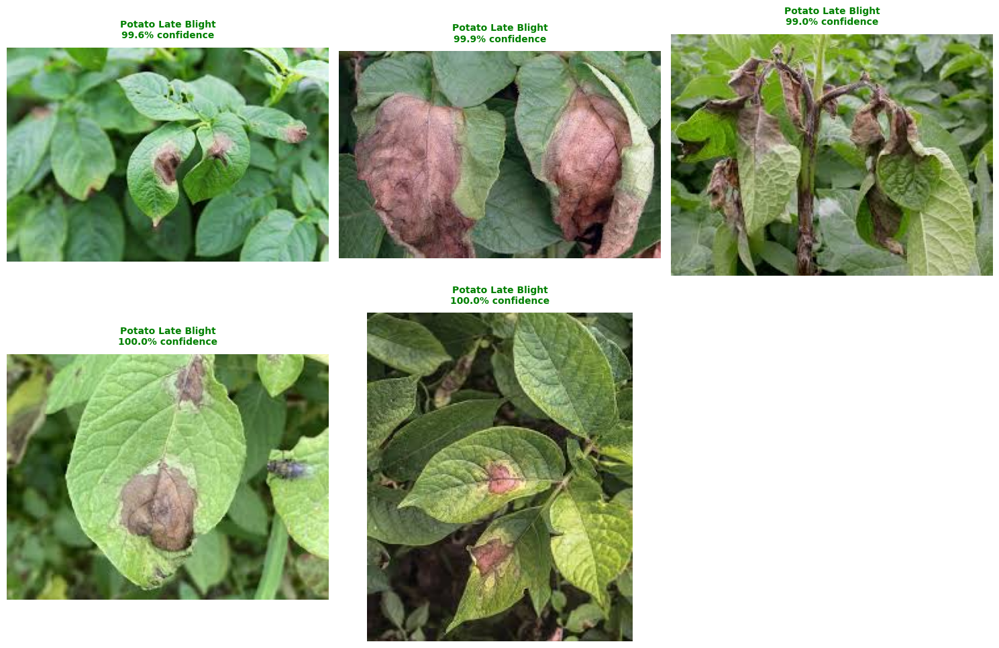


Processed 5 images successfully!


In [34]:
# Example usage:
if __name__ == "__main__":
    # Load model
    checkpoint_path = "./best_convnext_plant_disease_combined1.pth"
    model, class_names, device = load_model(checkpoint_path)
    
    # Test on a folder of images
    test_folder = "/kaggle/input/potato-late-blight"
    
    if os.path.exists(test_folder):
        print("\n" + "="*60)
        print("FOLDER PREDICTION")
        print("="*60 + "\n")
        results = predict_folder_with_display(
            model, 
            test_folder, 
            class_names, 
            device, 
            max_cols=3
        )
        print(f"\nProcessed {len(results)} images successfully!")
    else:
        print(f"\nTest folder not found: {test_folder}")
        print("Please provide a valid folder path to test multiple images.")

# Potato Early Blight


FOLDER PREDICTION

Found 5 images in folder: /kaggle/input/potato-ealry-blight
Making predictions...

1. Pasted image (3).png
   Prediction: Potato Early Blight (99.98%)

2. Pasted image (2).png
   Prediction: Potato Early Blight (61.69%)

3. Pasted image.png
   Prediction: Potato Early Blight (76.78%)

4. Pasted image (5).png
   Prediction: Potato Late Blight (81.06%)

5. Pasted image (4).png
   Prediction: Potato Early Blight (99.97%)



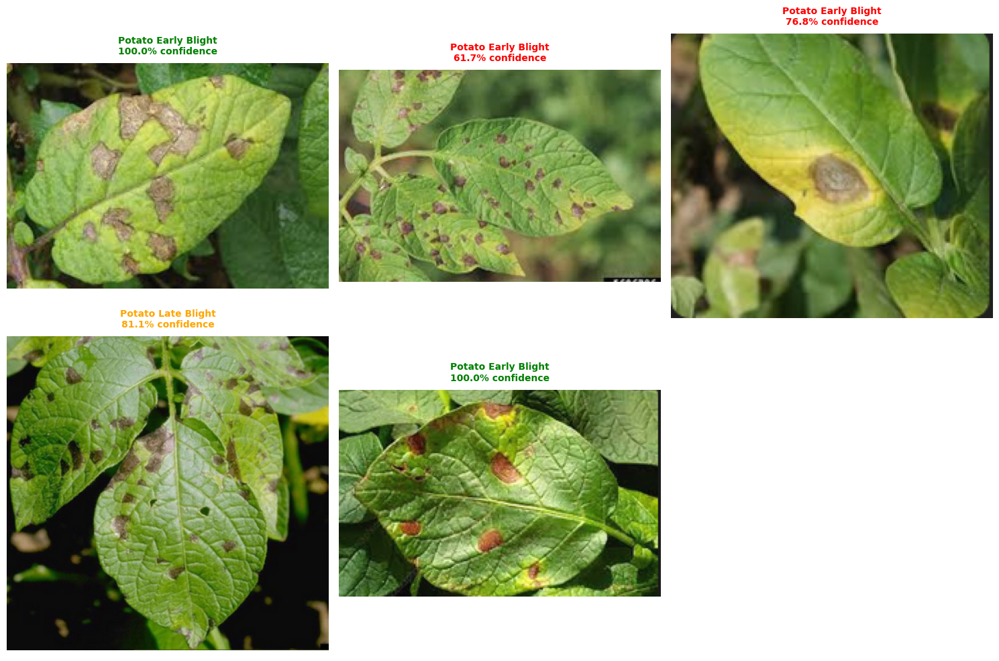


Processed 5 images successfully!


In [37]:
test_folder1 = "/kaggle/input/potato-ealry-blight"
if os.path.exists(test_folder):
        print("\n" + "="*60)
        print("FOLDER PREDICTION")
        print("="*60 + "\n")
        results = predict_folder_with_display(
            model, 
            test_folder1, 
            class_names, 
            device, 
            max_cols=3
        )
        print(f"\nProcessed {len(results)} images successfully!")
else:
        print(f"\nTest folder not found: {test_folder1}")
        print("Please provide a valid folder path to test multiple images.")

# Tomato Septoria Leaf Spot


FOLDER PREDICTION

Found 5 images in folder: /kaggle/input/tes-samples/Tomato Septoria Leaf Spot
Making predictions...

1. download (3).jpeg
   Prediction: Tomato Bacterial Spot (98.44%)

2. download (4).jpeg
   Prediction: Tomato Septoria Leaf Spot (99.99%)

3. download.jpeg
   Prediction: Tomato Septoria Leaf Spot (99.93%)

4. download (1).jpeg
   Prediction: Tomato Septoria Leaf Spot (76.90%)

5. download (2).jpeg
   Prediction: Tomato Septoria Leaf Spot (99.99%)



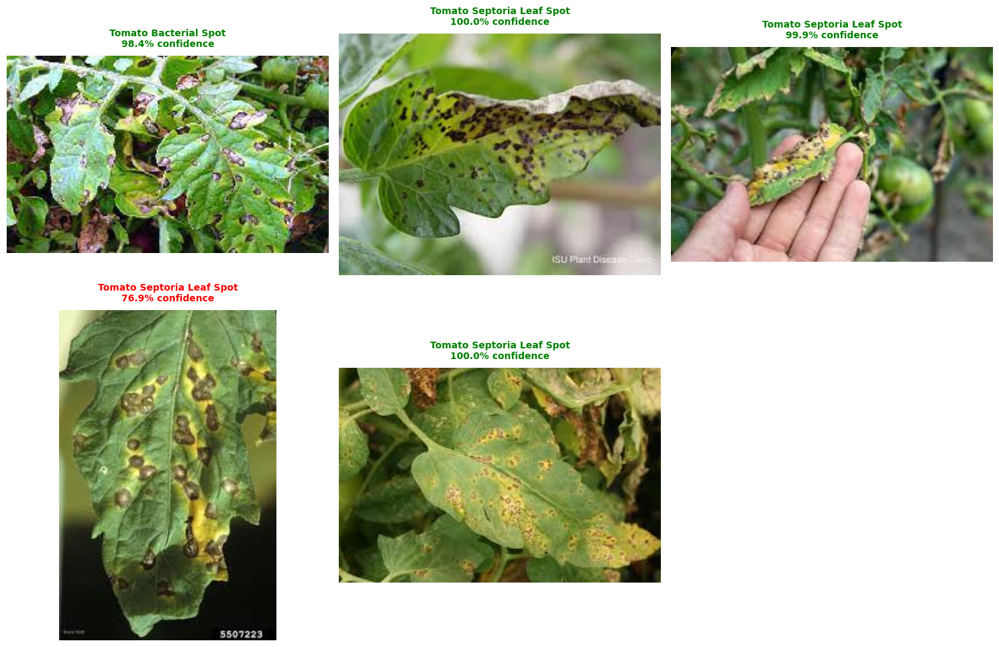


Processed 5 images successfully!


In [40]:
test_folder2 = "/kaggle/input/tes-samples/Tomato Septoria Leaf Spot"
if os.path.exists(test_folder):
        print("\n" + "="*60)
        print("FOLDER PREDICTION")
        print("="*60 + "\n")
        results = predict_folder_with_display(
            model, 
            test_folder2, 
            class_names, 
            device, 
            max_cols=3
        )
        print(f"\nProcessed {len(results)} images successfully!")
else:
        print(f"\nTest folder not found: {test_folder2}")
        print("Please provide a valid folder path to test multiple images.")

# Tomato Early Blight


FOLDER PREDICTION

Found 6 images in folder: /kaggle/input/tes-samples/tomato early blight
Making predictions...

1. jesse web early_blight_leafcux1200.jpg
   Prediction: Tomato Early Blight (99.93%)

2. download (3).jpeg
   Prediction: Potato Early Blight (43.04%)

3. IMG_1302.jpeg
   Prediction: Tomato Early Blight (99.96%)

4. download.jpeg
   Prediction: Tomato Early Blight (99.16%)

5. download (1).jpeg
   Prediction: Potato Early Blight (98.25%)

6. download (2).jpeg
   Prediction: Tomato Septoria Leaf Spot (98.91%)



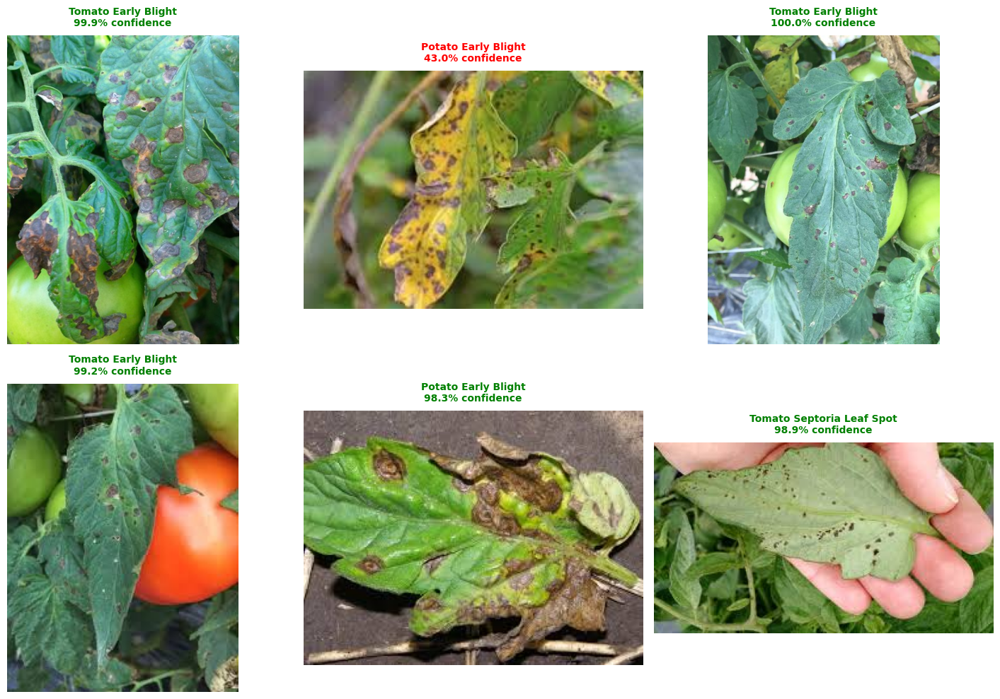


Processed 6 images successfully!


In [43]:
test_folder3 = "/kaggle/input/tes-samples/tomato early blight"
if os.path.exists(test_folder):
        print("\n" + "="*60)
        print("FOLDER PREDICTION")
        print("="*60 + "\n")
        results = predict_folder_with_display(
            model, 
            test_folder3, 
            class_names, 
            device, 
            max_cols=3
        )
        print(f"\nProcessed {len(results)} images successfully!")
else:
        print(f"\nTest folder not found: {test_folder3}")
        print("Please provide a valid folder path to test multiple images.")

# Tomato Late Blight


FOLDER PREDICTION

Found 6 images in folder: /kaggle/input/tes-samples/tomato late blight
Making predictions...

1. download (3).jpeg
   Prediction: Tomato Late Blight (99.99%)

2. download (4).jpeg
   Prediction: Tomato Early Blight (99.57%)

3. download.jpeg
   Prediction: Potato Late Blight (81.67%)

4. tomato-late-blight-tomato-1556463954.jpg
   Prediction: Tomato Late Blight (94.99%)

5. download (1).jpeg
   Prediction: Tomato Late Blight (100.00%)

6. download (2).jpeg
   Prediction: Tomato Late Blight (99.71%)



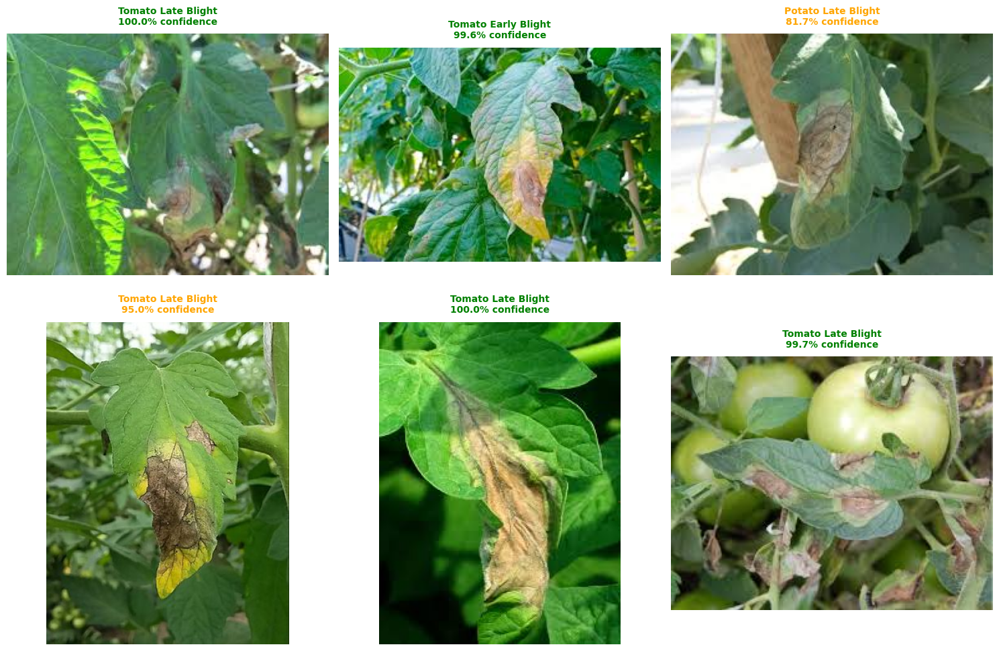


Processed 6 images successfully!


In [44]:
test_folder4 = "/kaggle/input/tes-samples/tomato late blight"
if os.path.exists(test_folder):
        print("\n" + "="*60)
        print("FOLDER PREDICTION")
        print("="*60 + "\n")
        results = predict_folder_with_display(
            model, 
            test_folder4, 
            class_names, 
            device, 
            max_cols=3
        )
        print(f"\nProcessed {len(results)} images successfully!")
else:
        print(f"\nTest folder not found: {test_folder4}")
        print("Please provide a valid folder path to test multiple images.")

# Tomato Healthy


FOLDER PREDICTION

Found 6 images in folder: /kaggle/input/healthy-leafs/Tomato Healthy
Making predictions...

1. images.jpeg
   Prediction: Tomato Healthy (90.52%)

2. download.jpeg
   Prediction: Tomato Late Blight (99.65%)

3. download (1).jpeg
   Prediction: Tomato Leaf Mold (46.04%)

4. close-up-tomato-leaf-view-beautiful-young-green-tomatoes-plants-pots-concept-organic-food-farmer-s-vegetabes-health-245109677.jpeg
   Prediction: Tomato Healthy (99.98%)

5. healthy-green-leaves-young-tomato-seedlings-ready-to-plant-out-kitchen-garden-218208055.jpeg
   Prediction: Tomato Healthy (99.98%)

6. download (2).jpeg
   Prediction: Tomato Healthy (85.68%)



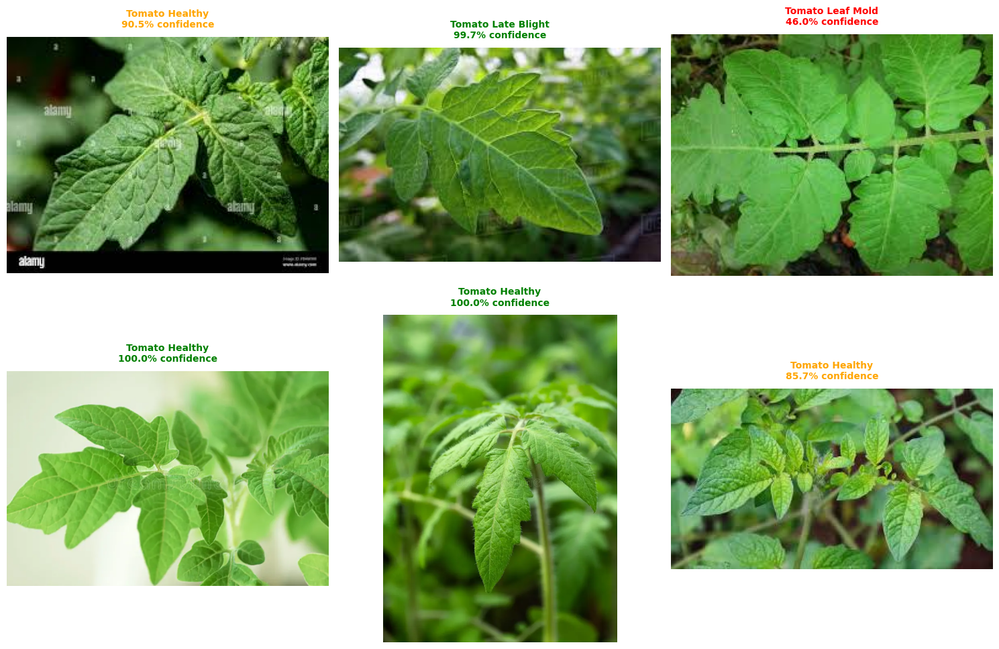


Processed 6 images successfully!


In [46]:
test_folder4 = "/kaggle/input/healthy-leafs/Tomato Healthy"
if os.path.exists(test_folder):
        print("\n" + "="*60)
        print("FOLDER PREDICTION")
        print("="*60 + "\n")
        results = predict_folder_with_display(
            model, 
            test_folder4, 
            class_names, 
            device, 
            max_cols=3
        )
        print(f"\nProcessed {len(results)} images successfully!")
else:
        print(f"\nTest folder not found: {test_folder4}")
        print("Please provide a valid folder path to test multiple images.")

# GRADCAM


In [47]:
import torch
import torch.nn as nn
from PIL import Image
import torchvision.transforms as transforms
from transformers import ConvNextForImageClassification, ConvNextImageProcessor
import os
import numpy as np
import cv2

def load_model(checkpoint_path, model_name="facebook/convnext-base-224", num_classes=13, device=None):
    """
    Load the trained ConvNeXt model with weights from checkpoint.
    
    Args:
        checkpoint_path (str): Path to the saved model checkpoint (.pth file)
        model_name (str): Pretrained model name from HuggingFace
        num_classes (int): Number of output classes
        device (torch.device): Device to load model on (cuda/cpu)
    
    Returns:
        model: Loaded model ready for inference
        class_names (list): List of class names in order
        device: Device the model is loaded on
    """
    if device is None:
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    print(f"Loading model on {device}...")
    
    # Load the model architecture
    model = ConvNextForImageClassification.from_pretrained(
        model_name,
        num_labels=num_classes,
        ignore_mismatched_sizes=True
    )
    
    # Load checkpoint
    if not os.path.exists(checkpoint_path):
        raise FileNotFoundError(f"Checkpoint not found at: {checkpoint_path}")
    
    checkpoint = torch.load(checkpoint_path, map_location=device)
    
    # Handle DataParallel wrapped models
    state_dict = checkpoint['model_state_dict']
    if list(state_dict.keys())[0].startswith('module.'):
        # Remove 'module.' prefix from keys
        state_dict = {k.replace('module.', ''): v for k, v in state_dict.items()}
    
    model.load_state_dict(state_dict)
    model = model.to(device)
    model.eval()
    
    print(f"Model loaded successfully from epoch {checkpoint.get('epoch', 'unknown')}")
    print(f"Best validation accuracy: {checkpoint.get('best_val_acc', 'unknown'):.4f}")
    
    # Define class names based on your combined directory structure
    class_names = [
        'Potato Early Blight',
        'Potato Healthy',
        'Potato Late Blight',
        'Tomato Bacterial Spot',
        'Tomato Early Blight',
        'Tomato Healthy',
        'Tomato Late Blight',
        'Tomato Leaf Mold',
        'Tomato Mosaic Virus',
        'Tomato Septoria Leaf Spot',
        'Tomato Spider Mites',
        'Tomato Target Spot',
        'Tomato Yellow Leaf Curl Virus'
    ]
    
    return model, class_names, device


def preprocess_image(image_path, model_name="facebook/convnext-base-224"):
    """
    Preprocess an image for model inference.
    
    Args:
        image_path (str): Path to the image file
        model_name (str): Model name to get the correct preprocessing parameters
    
    Returns:
        image_tensor: Preprocessed image tensor ready for model input
    """
    # Load feature extractor for preprocessing parameters
    feature_extractor = ConvNextImageProcessor.from_pretrained(model_name)
    
    # Define transforms matching training preprocessing
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(
            mean=feature_extractor.image_mean,
            std=feature_extractor.image_std
        ),
    ])
    
    # Load and preprocess image
    image = Image.open(image_path).convert('RGB')
    image_tensor = transform(image).unsqueeze(0)  # Add batch dimension
    
    return image_tensor


def predict_image(model, image_path, class_names, device, top_k=3):
    """
    Predict the class of an unseen image.
    
    Args:
        model: Trained model
        image_path (str): Path to the image file
        class_names (list): List of class names
        device: Device to run inference on
        top_k (int): Number of top predictions to return
    
    Returns:
        dict: Dictionary containing predictions and probabilities
    """
    # Preprocess image
    image_tensor = preprocess_image(image_path)
    image_tensor = image_tensor.to(device)
    
    # Make prediction
    with torch.no_grad():
        outputs = model(image_tensor).logits
        probabilities = torch.nn.functional.softmax(outputs, dim=1)
        
        # Get top k predictions
        top_probs, top_indices = torch.topk(probabilities, top_k, dim=1)
        top_probs = top_probs.squeeze().cpu().numpy()
        top_indices = top_indices.squeeze().cpu().numpy()
    
    # Prepare results
    results = {
        'predictions': [],
        'image_path': image_path
    }
    
    for i in range(top_k):
        idx = top_indices[i] if top_k > 1 else top_indices.item()
        prob = top_probs[i] if top_k > 1 else top_probs.item()
        results['predictions'].append({
            'class': class_names[idx],
            'confidence': float(prob),
            'class_index': int(idx)
        })
    
    return results


def predict_folder_with_display(model, folder_path, class_names, device, max_cols=3, figsize=(15, 5)):
    """
    Predict all images in a folder and display them in a grid with predictions.
    
    Args:
        model: Trained model
        folder_path (str): Path to folder containing images
        class_names (list): List of class names
        device: Device to run inference on
        max_cols (int): Maximum number of columns in the grid (default: 3)
        figsize (tuple): Figure size per row (default: (15, 5))
    
    Returns:
        list: List of all prediction results
    """
    import matplotlib.pyplot as plt
    from matplotlib.patches import Rectangle
    
    # Get all image files from folder
    image_extensions = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.webp'}
    image_files = []
    
    if not os.path.exists(folder_path):
        print(f"Folder not found: {folder_path}")
        return []
    
    for file in os.listdir(folder_path):
        if os.path.splitext(file.lower())[1] in image_extensions:
            image_files.append(os.path.join(folder_path, file))
    
    if len(image_files) == 0:
        print(f"No images found in folder: {folder_path}")
        return []
    
    print(f"Found {len(image_files)} images in folder: {folder_path}")
    print("Making predictions...\n")
    
    # Make predictions for all images
    all_results = []
    for img_path in image_files:
        try:
            result = predict_image(model, img_path, class_names, device, top_k=1)
            all_results.append(result)
        except Exception as e:
            print(f"Error processing {img_path}: {e}")
            continue
    
    # Display images in grid
    num_images = len(all_results)
    num_cols = min(max_cols, num_images)
    num_rows = (num_images + num_cols - 1) // num_cols
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(figsize[0], figsize[1] * num_rows))
    
    # Handle single row/column cases
    if num_rows == 1 and num_cols == 1:
        axes = [[axes]]
    elif num_rows == 1:
        axes = [axes]
    elif num_cols == 1:
        axes = [[ax] for ax in axes]
    
    for idx, result in enumerate(all_results):
        row = idx // num_cols
        col = idx % num_cols
        ax = axes[row][col]
        
        # Load and display image
        img = Image.open(result['image_path'])
        ax.imshow(img)
        
        # Get prediction details
        pred = result['predictions'][0]
        confidence = pred['confidence'] * 100
        class_name = pred['class']
        
        # Color code based on confidence
        if confidence >= 95:
            color = 'green'
        elif confidence >= 80:
            color = 'orange'
        else:
            color = 'red'
        
        # Set title with prediction
        title = f"{class_name}\n{confidence:.1f}% confidence"
        ax.set_title(title, fontsize=10, fontweight='bold', color=color, pad=10)
        
        # Add colored border
        for spine in ax.spines.values():
            spine.set_edgecolor(color)
            spine.set_linewidth(3)
        
        ax.axis('off')
        
        # Print prediction to console
        filename = os.path.basename(result['image_path'])
        print(f"{idx+1}. {filename}")
        print(f"   Prediction: {class_name} ({confidence:.2f}%)\n")
    
    # Hide empty subplots
    for idx in range(num_images, num_rows * num_cols):
        row = idx // num_cols
        col = idx % num_cols
        axes[row][col].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return all_results


def predict_folder_with_display(model, folder_path, class_names, device, max_cols=3, figsize=(15, 5)):
    """
    Predict all images in a folder and display them in a grid with predictions.
    
    Args:
        model: Trained model
        folder_path (str): Path to folder containing images
        class_names (list): List of class names
        device: Device to run inference on
        max_cols (int): Maximum number of columns in the grid (default: 3)
        figsize (tuple): Figure size per row (default: (15, 5))
    
    Returns:
        list: List of all prediction results
    """
    import matplotlib.pyplot as plt
    from matplotlib.patches import Rectangle
    
    # Get all image files from folder
    image_extensions = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.webp'}
    image_files = []
    
    if not os.path.exists(folder_path):
        print(f"Folder not found: {folder_path}")
        return []
    
    for file in os.listdir(folder_path):
        if os.path.splitext(file.lower())[1] in image_extensions:
            image_files.append(os.path.join(folder_path, file))
    
    if len(image_files) == 0:
        print(f"No images found in folder: {folder_path}")
        return []
    
    print(f"Found {len(image_files)} images in folder: {folder_path}")
    print("Making predictions...\n")
    
    # Make predictions for all images
    all_results = []
    for img_path in image_files:
        try:
            result = predict_image(model, img_path, class_names, device, top_k=1)
            all_results.append(result)
        except Exception as e:
            print(f"Error processing {img_path}: {e}")
            continue
    
    # Display images in grid
    num_images = len(all_results)
    num_cols = min(max_cols, num_images)
    num_rows = (num_images + num_cols - 1) // num_cols
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(figsize[0], figsize[1] * num_rows))
    
    # Handle single row/column cases
    if num_rows == 1 and num_cols == 1:
        axes = [[axes]]
    elif num_rows == 1:
        axes = [axes]
    elif num_cols == 1:
        axes = [[ax] for ax in axes]
    
    for idx, result in enumerate(all_results):
        row = idx // num_cols
        col = idx % num_cols
        ax = axes[row][col]
        
        # Load and display image
        img = Image.open(result['image_path'])
        ax.imshow(img)
        
        # Get prediction details
        pred = result['predictions'][0]
        confidence = pred['confidence'] * 100
        class_name = pred['class']
        
        # Color code based on confidence
        if confidence >= 95:
            color = 'green'
        elif confidence >= 80:
            color = 'orange'
        else:
            color = 'red'
        
        # Set title with prediction
        title = f"{class_name}\n{confidence:.1f}% confidence"
        ax.set_title(title, fontsize=10, fontweight='bold', color=color, pad=10)
        
        # Add colored border
        for spine in ax.spines.values():
            spine.set_edgecolor(color)
            spine.set_linewidth(3)
        
        ax.axis('off')
        
        # Print prediction to console
        filename = os.path.basename(result['image_path'])
        print(f"{idx+1}. {filename}")
        print(f"   Prediction: {class_name} ({confidence:.2f}%)\n")
    
    # Hide empty subplots
    for idx in range(num_images, num_rows * num_cols):
        row = idx // num_cols
        col = idx % num_cols
        axes[row][col].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return all_results


class GradCAM:
    """
    Grad-CAM: Visual Explanations from Deep Networks via Gradient-based Localization
    """
    def __init__(self, model, target_layer):
        """
        Initialize GradCAM.
        
        Args:
            model: Trained model
            target_layer: Target layer for Grad-CAM (usually last conv layer)
        """
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        
        # Register hooks
        self.target_layer.register_forward_hook(self.save_activation)
        self.target_layer.register_backward_hook(self.save_gradient)
    
    def save_activation(self, module, input, output):
        """Hook to save forward pass activations"""
        self.activations = output.detach()
    
    def save_gradient(self, module, grad_input, grad_output):
        """Hook to save backward pass gradients"""
        self.gradients = grad_output[0].detach()
    
    def generate_cam(self, input_tensor, target_class=None):
        """
        Generate Grad-CAM heatmap.
        
        Args:
            input_tensor: Preprocessed input image tensor
            target_class: Target class index (if None, uses predicted class)
        
        Returns:
            cam: Grad-CAM heatmap (numpy array)
            predicted_class: Predicted class index
        """
        # Forward pass
        self.model.eval()
        output = self.model(input_tensor).logits
        
        # Get predicted class if not specified
        if target_class is None:
            target_class = output.argmax(dim=1).item()
        
        # Backward pass
        self.model.zero_grad()
        target = output[0, target_class]
        target.backward()
        
        # Generate CAM
        gradients = self.gradients[0].cpu().numpy()  # [C, H, W]
        activations = self.activations[0].cpu().numpy()  # [C, H, W]
        
        # Global average pooling of gradients
        weights = np.mean(gradients, axis=(1, 2))  # [C]
        
        # Weighted combination of activation maps
        cam = np.zeros(activations.shape[1:], dtype=np.float32)  # [H, W]
        for i, w in enumerate(weights):
            cam += w * activations[i]
        
        # Apply ReLU
        cam = np.maximum(cam, 0)
        
        # Normalize
        if cam.max() > 0:
            cam = cam / cam.max()
        
        return cam, target_class


class GradCAMPlusPlus:
    """
    Grad-CAM++: Improved Visual Explanations for Deep Convolutional Networks
    """
    def __init__(self, model, target_layer):
        """
        Initialize Grad-CAM++.
        
        Args:
            model: Trained model
            target_layer: Target layer for Grad-CAM++ (usually last conv layer)
        """
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        
        # Register hooks
        self.target_layer.register_forward_hook(self.save_activation)
        self.target_layer.register_backward_hook(self.save_gradient)
    
    def save_activation(self, module, input, output):
        """Hook to save forward pass activations"""
        self.activations = output.detach()
    
    def save_gradient(self, module, grad_input, grad_output):
        """Hook to save backward pass gradients"""
        self.gradients = grad_output[0].detach()
    
    def generate_cam(self, input_tensor, target_class=None):
        """
        Generate Grad-CAM++ heatmap.
        
        Args:
            input_tensor: Preprocessed input image tensor
            target_class: Target class index (if None, uses predicted class)
        
        Returns:
            cam: Grad-CAM++ heatmap (numpy array)
            predicted_class: Predicted class index
        """
        # Forward pass
        self.model.eval()
        output = self.model(input_tensor).logits
        
        # Get predicted class if not specified
        if target_class is None:
            target_class = output.argmax(dim=1).item()
        
        # Backward pass
        self.model.zero_grad()
        target = output[0, target_class]
        target.backward(retain_graph=True)
        
        # Get gradients and activations
        gradients = self.gradients[0].cpu().numpy()  # [C, H, W]
        activations = self.activations[0].cpu().numpy()  # [C, H, W]
        
        # Calculate alpha (weights)
        numerator = gradients ** 2
        denominator = 2 * (gradients ** 2) + \
                      np.sum(activations * (gradients ** 3), axis=(1, 2), keepdims=True)
        denominator = np.where(denominator != 0, denominator, 1e-10)
        alpha = numerator / denominator
        
        # Calculate weights with ReLU
        relu_grad = np.maximum(gradients, 0)
        weights = np.sum(alpha * relu_grad, axis=(1, 2))
        
        # Weighted combination of activation maps
        cam = np.zeros(activations.shape[1:], dtype=np.float32)
        for i, w in enumerate(weights):
            cam += w * activations[i]
        
        # Apply ReLU
        cam = np.maximum(cam, 0)
        
        # Normalize
        if cam.max() > 0:
            cam = cam / cam.max()
        
        return cam, target_class


def apply_colormap_on_image(image, cam, alpha=0.5, colormap=cv2.COLORMAP_JET):
    """
    Apply CAM heatmap on original image.
    
    Args:
        image: Original image (PIL Image or numpy array)
        cam: CAM heatmap (numpy array)
        alpha: Transparency of heatmap overlay (0-1)
        colormap: OpenCV colormap
    
    Returns:
        result: Image with heatmap overlay (numpy array)
    """
    # Convert PIL image to numpy if needed
    if isinstance(image, Image.Image):
        image = np.array(image)
    
    # Resize CAM to match image size
    h, w = image.shape[:2]
    cam_resized = cv2.resize(cam, (w, h))
    
    # Apply colormap
    heatmap = cv2.applyColorMap(np.uint8(255 * cam_resized), colormap)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    
    # Overlay heatmap on image
    result = heatmap * alpha + image * (1 - alpha)
    result = np.uint8(result)
    
    return result, heatmap


def visualize_gradcam(model, image_path, class_names, device, method='gradcam++', target_class=None):
    """
    Visualize Grad-CAM or Grad-CAM++ for a single image.
    
    Args:
        model: Trained model
        image_path: Path to image file
        class_names: List of class names
        device: Device to run on
        method: 'gradcam' or 'gradcam++' (default: 'gradcam++')
        target_class: Target class index (if None, uses predicted class)
    
    Returns:
        None (displays visualization)
    """
    import matplotlib.pyplot as plt
    
    # Get target layer (last convolutional layer in ConvNeXt)
    # For ConvNeXt, the last layer before classifier is in stages
    target_layer = model.convnext.encoder.stages[-1].layers[-1]
    
    # Initialize Grad-CAM or Grad-CAM++
    if method.lower() == 'gradcam':
        cam_extractor = GradCAM(model, target_layer)
        title_method = "Grad-CAM"
    else:
        cam_extractor = GradCAMPlusPlus(model, target_layer)
        title_method = "Grad-CAM++"
    
    # Preprocess image
    input_tensor = preprocess_image(image_path).to(device)
    
    # Generate CAM
    cam, predicted_class = cam_extractor.generate_cam(input_tensor, target_class)
    
    # Load original image
    original_image = Image.open(image_path).convert('RGB')
    
    # Apply colormap
    result, heatmap = apply_colormap_on_image(original_image, cam, alpha=0.5)
    
    # Get prediction details
    with torch.no_grad():
        output = model(input_tensor).logits
        probabilities = torch.nn.functional.softmax(output, dim=1)
        confidence = probabilities[0, predicted_class].item()
    
    # Visualize
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    # Original image
    axes[0].imshow(original_image)
    axes[0].set_title('Original Image', fontsize=12, fontweight='bold')
    axes[0].axis('off')
    
    # Heatmap only
    axes[1].imshow(heatmap)
    axes[1].set_title(f'{title_method} Heatmap', fontsize=12, fontweight='bold')
    axes[1].axis('off')
    
    # Overlay
    axes[2].imshow(result)
    pred_name = class_names[predicted_class]
    axes[2].set_title(f'{title_method} Overlay\n{pred_name} ({confidence*100:.1f}%)', 
                      fontsize=12, fontweight='bold')
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print(f"\nPrediction: {pred_name}")
    print(f"Confidence: {confidence*100:.2f}%")
    print(f"Class Index: {predicted_class}")


def visualize_gradcam_folder(model, folder_path, class_names, device, method='gradcam++', 
                              max_images=9, max_cols=3):
    """
    Visualize Grad-CAM/Grad-CAM++ for multiple images in a folder.
    
    Args:
        model: Trained model
        folder_path: Path to folder containing images
        class_names: List of class names
        device: Device to run on
        method: 'gradcam' or 'gradcam++' (default: 'gradcam++')
        max_images: Maximum number of images to visualize
        max_cols: Maximum columns in grid
    
    Returns:
        None (displays visualization)
    """
    import matplotlib.pyplot as plt
    
    # Get image files
    image_extensions = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.webp'}
    image_files = []
    
    if not os.path.exists(folder_path):
        print(f"Folder not found: {folder_path}")
        return
    
    for file in os.listdir(folder_path):
        if os.path.splitext(file.lower())[1] in image_extensions:
            image_files.append(os.path.join(folder_path, file))
            if len(image_files) >= max_images:
                break
    
    if len(image_files) == 0:
        print(f"No images found in folder: {folder_path}")
        return
    
    print(f"Visualizing {len(image_files)} images with {method.upper()}...\n")
    
    # Get target layer
    target_layer = model.convnext.encoder.stages[-1].layers[-1]
    
    # Initialize CAM extractor
    if method.lower() == 'gradcam':
        cam_extractor = GradCAM(model, target_layer)
        title_method = "Grad-CAM"
    else:
        cam_extractor = GradCAMPlusPlus(model, target_layer)
        title_method = "Grad-CAM++"
    
    # Calculate grid dimensions
    num_images = len(image_files)
    num_cols = min(max_cols, num_images)
    num_rows = (num_images + num_cols - 1) // num_cols
    
    # Create figure with subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5*num_cols, 5*num_rows))
    
    # Handle single row/column cases
    if num_rows == 1 and num_cols == 1:
        axes = [[axes]]
    elif num_rows == 1:
        axes = [axes]
    elif num_cols == 1:
        axes = [[ax] for ax in axes]
    
    # Process each image
    for idx, img_path in enumerate(image_files):
        row = idx // num_cols
        col = idx % num_cols
        ax = axes[row][col]
        
        try:
            # Preprocess and generate CAM
            input_tensor = preprocess_image(img_path).to(device)
            cam, predicted_class = cam_extractor.generate_cam(input_tensor)
            
            # Load original image and apply overlay
            original_image = Image.open(img_path).convert('RGB')
            result, _ = apply_colormap_on_image(original_image, cam, alpha=0.5)
            
            # Get prediction details
            with torch.no_grad():
                output = model(input_tensor).logits
                probabilities = torch.nn.functional.softmax(output, dim=1)
                confidence = probabilities[0, predicted_class].item()
            
            # Display
            ax.imshow(result)
            pred_name = class_names[predicted_class]
            filename = os.path.basename(img_path)
            
            # Color code by confidence
            if confidence >= 0.95:
                color = 'green'
            elif confidence >= 0.80:
                color = 'orange'
            else:
                color = 'red'
            
            ax.set_title(f"{pred_name}\n{confidence*100:.1f}% | {filename}", 
                        fontsize=9, fontweight='bold', color=color)
            ax.axis('off')
            
            print(f"{idx+1}. {filename}")
            print(f"   {pred_name} ({confidence*100:.2f}%)\n")
            
        except Exception as e:
            print(f"Error processing {img_path}: {e}")
            ax.axis('off')
            continue
    
    # Hide empty subplots
    for idx in range(num_images, num_rows * num_cols):
        row = idx // num_cols
        col = idx % num_cols
        axes[row][col].axis('off')
    
    plt.suptitle(f'{title_method} Visualization', fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.show()




Loading model on cuda...


Some weights of ConvNextForImageClassification were not initialized from the model checkpoint at facebook/convnext-base-224 and are newly initialized because the shapes did not match:
- classifier.weight: found shape torch.Size([1000, 1024]) in the checkpoint and torch.Size([13, 1024]) in the model instantiated
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([13]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Model loaded successfully from epoch 9
Best validation accuracy: 0.9929

Predictions for: /kaggle/input/potato-ealry-blight/Pasted image (2).png
------------------------------------------------------------
1. Potato Early Blight: 61.69%
2. Tomato Septoria Leaf Spot: 36.00%
3. Tomato Bacterial Spot: 1.68%

GRAD-CAM++ VISUALIZATION


/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1830: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


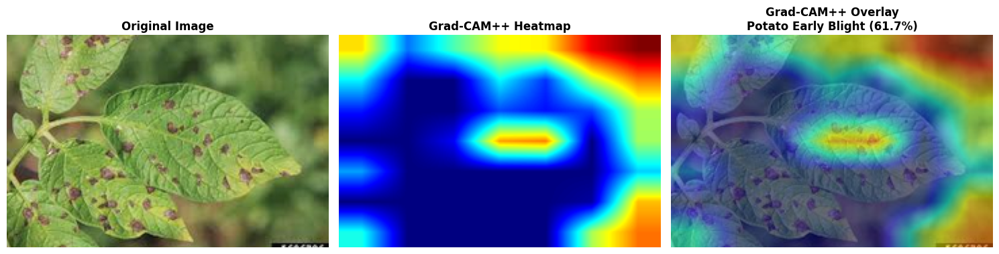


Prediction: Potato Early Blight
Confidence: 61.69%
Class Index: 0

GRAD-CAM VISUALIZATION


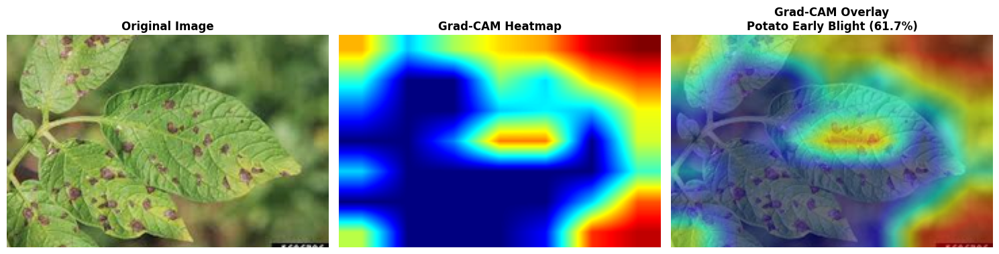


Prediction: Potato Early Blight
Confidence: 61.69%
Class Index: 0


In [48]:
# Example usage:
if __name__ == "__main__":
    # Load model
    checkpoint_path = "./best_convnext_plant_disease_combined1.pth"
    model, class_names, device = load_model(checkpoint_path)
    
    # Test on a single image
    image_path = "/kaggle/input/potato-ealry-blight/Pasted image (2).png"
    
    if os.path.exists(image_path):
        # Regular prediction
        results = predict_image(model, image_path, class_names, device, top_k=3)
        
        print(f"\nPredictions for: {results['image_path']}")
        print("-" * 60)
        for i, pred in enumerate(results['predictions'], 1):
            print(f"{i}. {pred['class']}: {pred['confidence']*100:.2f}%")
        
        # Visualize Grad-CAM++
        print("\n" + "="*60)
        print("GRAD-CAM++ VISUALIZATION")
        print("="*60)
        visualize_gradcam(model, image_path, class_names, device, method='gradcam++')
        
        # Compare Grad-CAM vs Grad-CAM++
        print("\n" + "="*60)
        print("GRAD-CAM VISUALIZATION")
        print("="*60)
        visualize_gradcam(model, image_path, class_names, device, method='gradcam')
    else:
        print(f"Image not found: {image_path}")
    



FOLDER PREDICTION

Found 6 images in folder: /kaggle/input/tes-samples/tomato early blight
Making predictions...

1. jesse web early_blight_leafcux1200.jpg
   Prediction: Tomato Early Blight (99.93%)

2. download (3).jpeg
   Prediction: Potato Early Blight (43.04%)

3. IMG_1302.jpeg
   Prediction: Tomato Early Blight (99.96%)

4. download.jpeg
   Prediction: Tomato Early Blight (99.16%)

5. download (1).jpeg
   Prediction: Potato Early Blight (98.25%)

6. download (2).jpeg
   Prediction: Tomato Septoria Leaf Spot (98.91%)



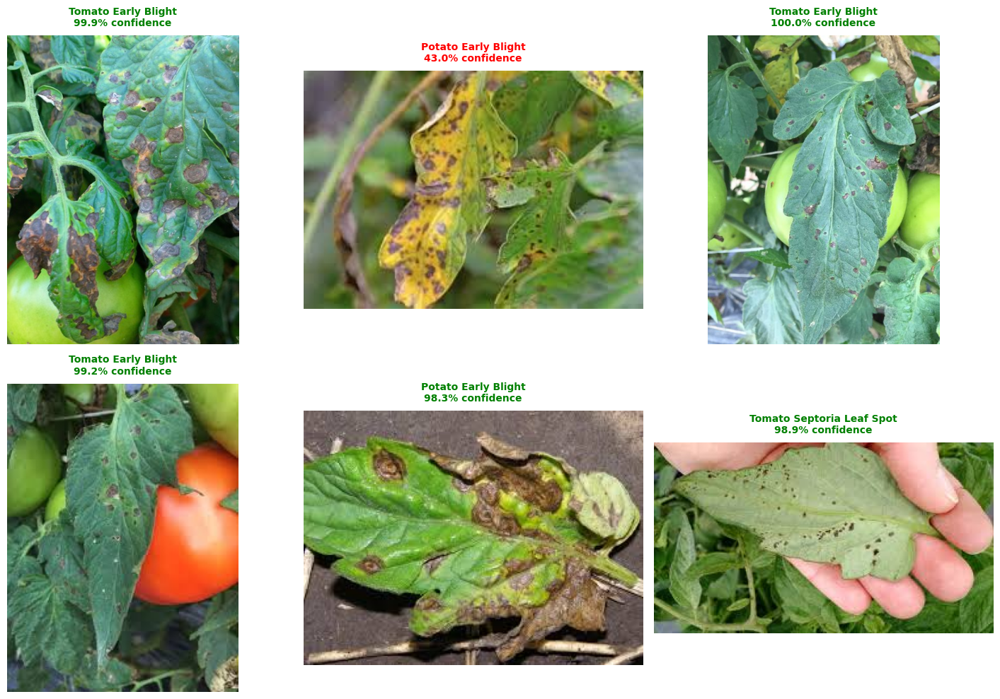


Processed 6 images successfully!

GRAD-CAM++ FOLDER VISUALIZATION

Visualizing 6 images with GRADCAM++...

1. jesse web early_blight_leafcux1200.jpg
   Tomato Early Blight (99.93%)

2. download (3).jpeg
   Potato Early Blight (43.04%)

3. IMG_1302.jpeg
   Tomato Early Blight (99.96%)

4. download.jpeg
   Tomato Early Blight (99.16%)

5. download (1).jpeg
   Potato Early Blight (98.25%)

6. download (2).jpeg
   Tomato Septoria Leaf Spot (98.91%)



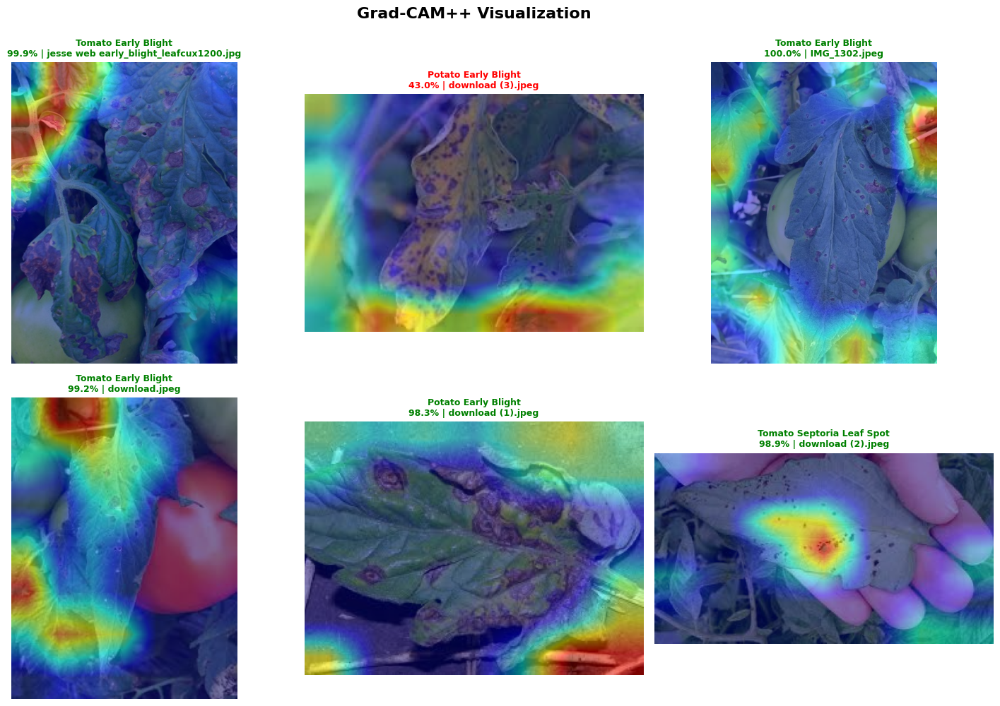

In [50]:
    # Test on a folder of images
    test_folder5 = "/kaggle/input/tes-samples/tomato early blight"
    
    if os.path.exists(test_folder):
        print("\n" + "="*60)
        print("FOLDER PREDICTION")
        print("="*60 + "\n")
        results = predict_folder_with_display(
            model, 
            test_folder5, 
            class_names, 
            device, 
            max_cols=3
        )
        print(f"\nProcessed {len(results)} images successfully!")
        
        # Visualize Grad-CAM++ for folder
        print("\n" + "="*60)
        print("GRAD-CAM++ FOLDER VISUALIZATION")
        print("="*60 + "\n")
        visualize_gradcam_folder(
            model,
            test_folder5,
            class_names,
            device,
            method='gradcam++',
            max_images=9,
            max_cols=3
        )
    else:
        print(f"\nTest folder not found: {test_folder5}")
        print("Please provide a valid folder path to test multiple images.")